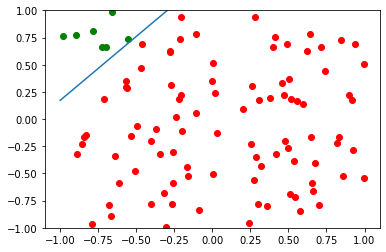

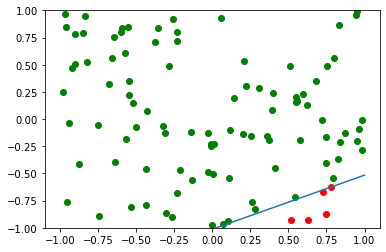

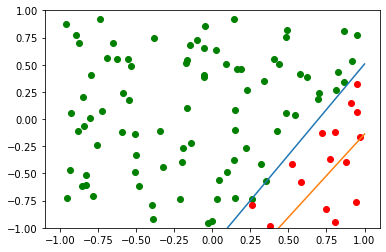

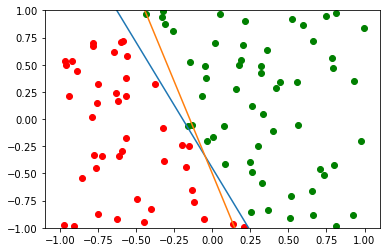

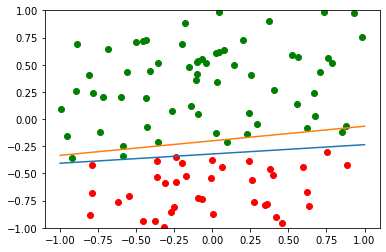

...

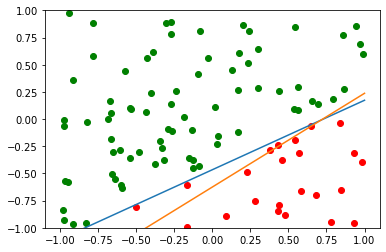

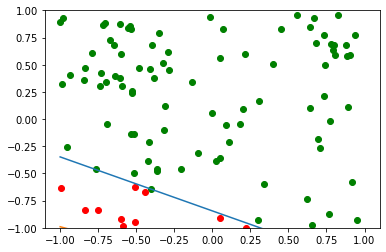

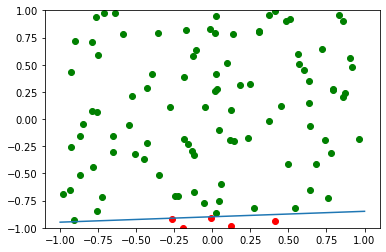

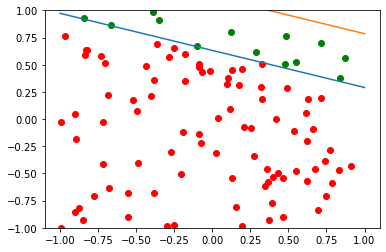

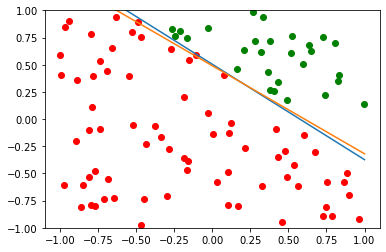

KeyboardInterrupt: 

In [57]:
import matplotlib.pyplot as plt
import numpy as np
Error = []
G = []
F = []
for i in range(1000):
    def target(xfunc):
        a = (xfunc[1][1]-xfunc[0][1])/(xfunc[1][0]-xfunc[0][0])
        b = xfunc[0][1] - a*xfunc[0][0]
        return a,b

    def data(N,d):
        data = np.random.uniform(-1,1,(N,d))
        return data
    xfunc = np.random.uniform(-1,1,(2,2))
    a,b = target(xfunc)
    d = 2
    N = 100
    xdata = data(N,d)
    f = a*xdata[:,0] + b
    xaxis = np.linspace(-1,1,1000)
    yval = np.reshape(np.sign(xdata[:,1] - f),(-1,1))
    points = np.concatenate((xdata,yval),axis=1)
    for point in range(len(points[:,-1])):
        if points[point,-1] == 1:
            plt.scatter(points[point,0],points[point,1],color='green',label = 'green')
        else:
            plt.scatter(points[point,0],points[point,1],color='red', label = 'red')
    plt.ylim(-1,1)
    plt.plot(xaxis,a*xaxis + b, label = 'target function')
    x0 = np.ones((N,1))
    x = np.concatenate((x0,xdata),axis=1)

    #Linear regression algorithm
    X = np.dot(np.linalg.inv(np.dot(np.transpose(x),x)),np.transpose(x)) #X = (x^T*x)^-1*x^T

    w = np.dot(X,yval)

    x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
    plt.plot(xaxis,x2,label = 'hypothesis function')
    plt.show()
    norm = np.linalg.norm(np.sign(np.dot(x,w))-yval)
    Ein = (norm**2)/N
    Error.append(Ein)
    G.append(w)
    F.append([a,b])

In [2]:
error = np.array(Error)
print(sum(error)/1000)
print(G)

0.15036000000000047
[array([[ 0.12082931],
       [-1.0068355 ],
       [ 1.12906413]]), array([[0.67662983],
       [0.79328787],
       [0.01182668]]), array([[-0.35396737],
       [ 0.54495455],
       [ 1.1140681 ]]), array([[-0.53111859],
       [-0.1286504 ],
       [ 1.09769353]]), array([[0.64032667],
       [0.52704036],
       [0.69267546]]), array([[ 0.44633755],
       [-1.09667912],
       [ 0.30779356]]), array([[-0.53469787],
       [-1.06362995],
       [ 0.48009826]]), array([[-0.18557779],
       [-1.26058214],
       [ 0.71448569]]), array([[-0.12787095],
       [-0.58901647],
       [ 1.24816129]]), array([[ 0.39612052],
       [-0.75955729],
       [ 0.79731133]]), array([[-0.03532962],
       [ 0.99800779],
       [ 0.94535586]]), array([[0.62901153],
       [0.80990135],
       [0.41667771]]), array([[ 0.5907959 ],
       [-0.41573488],
       [ 1.03336693]]), array([[ 0.29154953],
       [-1.51568476],
       [ 0.26187717]]), array([[-0.27154659],
       [ 0.514

In [3]:
Eout = []
for i in range(1000):
    sample = np.random.uniform(-1,1,(1000,2))
    for j in range(1000):
        count = 0
        for k in range(1000):
            if np.sign(G[j][2]*sample[k][1]+G[j][1]*sample[k][0]+G[j][0]) != np.sign(sample[k][1]-(sample[k][0]*F[j][0]+F[j][1])):
                count += 1
        Eout.append(count/1000)
        

In [4]:
print(sum(Eout)/len(Eout))
print(Eout[0:2000])

0.04698803399998479
[0.025, 0.062, 0.038, 0.023, 0.036, 0.035, 0.037, 0.038, 0.027, 0.009, 0.014, 0.052, 0.008, 0.038, 0.031, 0.092, 0.007, 0.063, 0.0, 0.046, 0.07, 0.042, 0.023, 0.026, 0.082, 0.088, 0.057, 0.023, 0.106, 0.06, 0.031, 0.061, 0.038, 0.025, 0.135, 0.04, 0.014, 0.033, 0.016, 0.066, 0.09, 0.007, 0.026, 0.061, 0.143, 0.069, 0.035, 0.02, 0.051, 0.019, 0.068, 0.028, 0.03, 0.016, 0.032, 0.016, 0.042, 0.008, 0.092, 0.031, 0.021, 0.027, 0.028, 0.049, 0.021, 0.041, 0.111, 0.093, 0.029, 0.13, 0.075, 0.04, 0.026, 0.07, 0.069, 0.033, 0.023, 0.018, 0.14, 0.04, 0.026, 0.029, 0.043, 0.007, 0.017, 0.041, 0.034, 0.05, 0.08, 0.019, 0.053, 0.029, 0.045, 0.052, 0.045, 0.034, 0.031, 0.017, 0.048, 0.038, 0.041, 0.037, 0.047, 0.142, 0.021, 0.032, 0.091, 0.075, 0.057, 0.058, 0.093, 0.065, 0.029, 0.071, 0.015, 0.034, 0.097, 0.05, 0.018, 0.071, 0.098, 0.028, 0.035, 0.009, 0.038, 0.053, 0.089, 0.019, 0.04, 0.055, 0.042, 0.122, 0.021, 0.037, 0.045, 0.026, 0.004, 0.065, 0.04, 0.051, 0.036, 0.016, 0.0

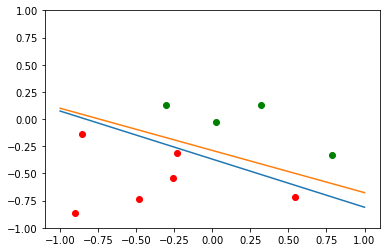

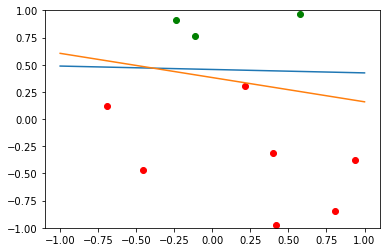

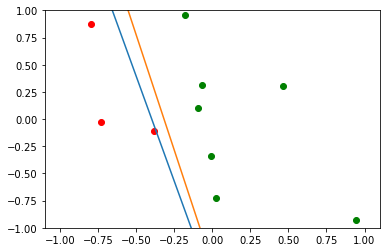

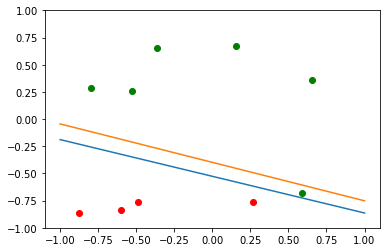

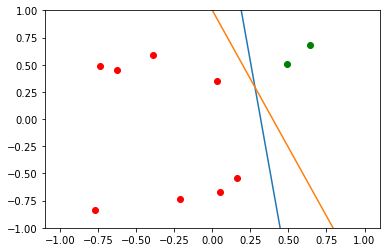

...

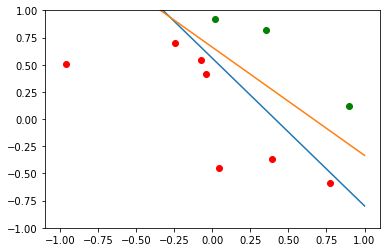

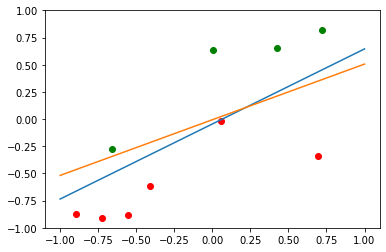

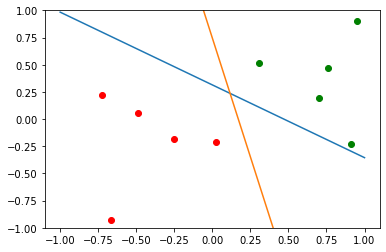

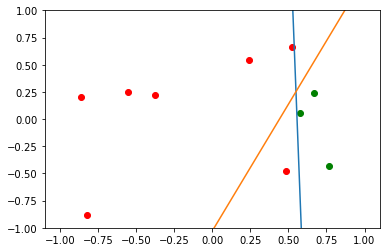

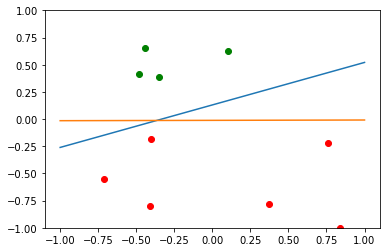

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


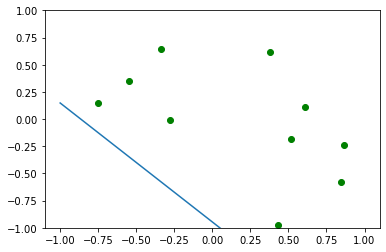

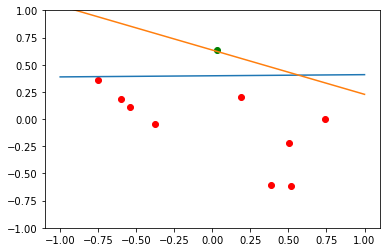

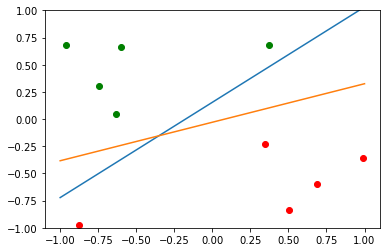

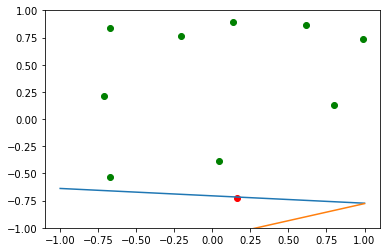

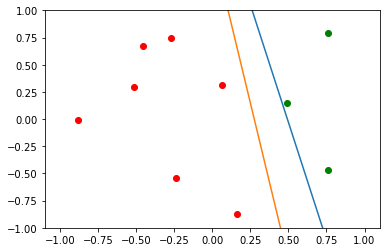

...

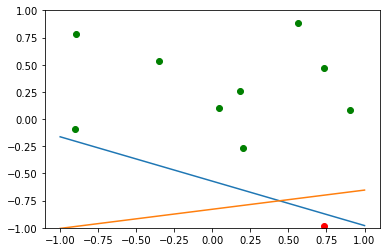

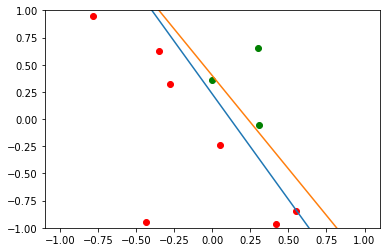

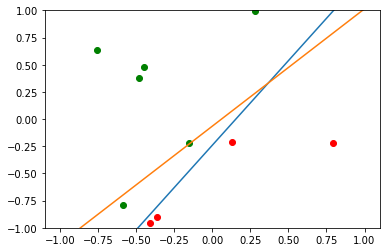

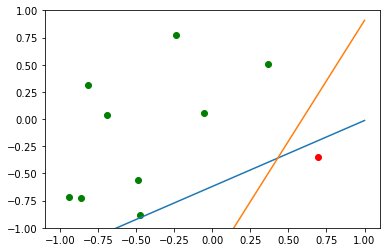

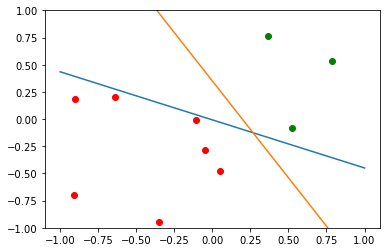

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


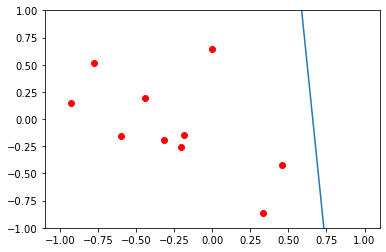

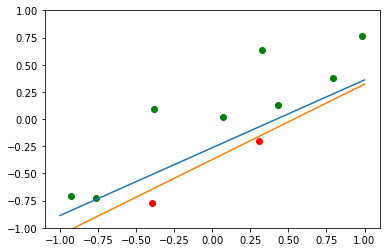

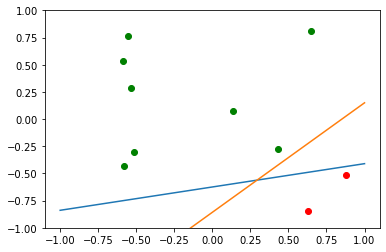

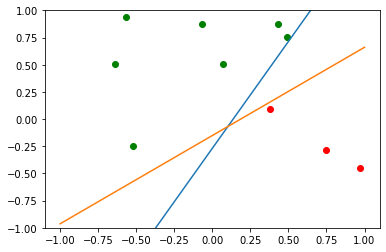

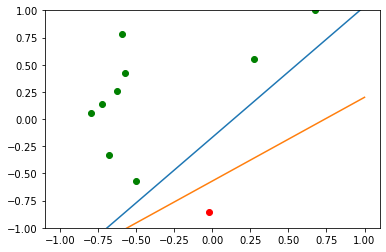

...

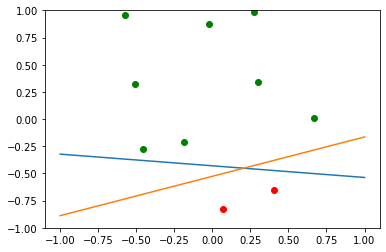

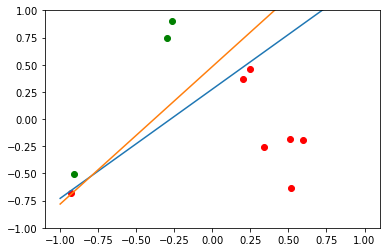

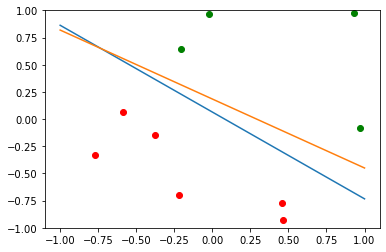

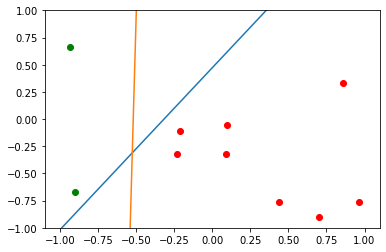

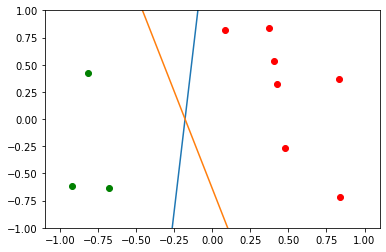

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


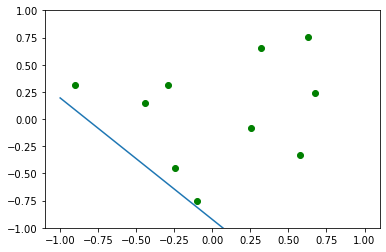

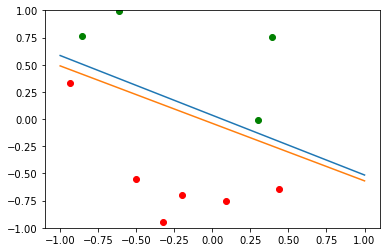

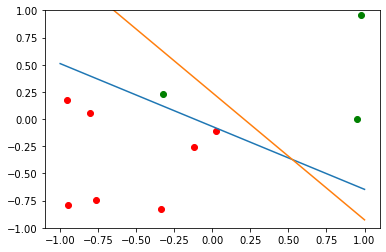

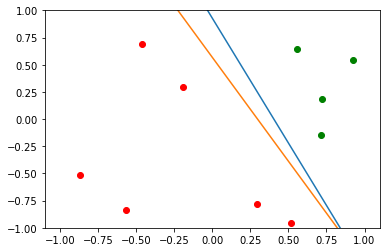

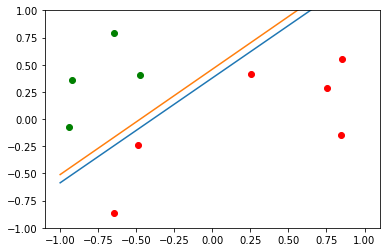

...

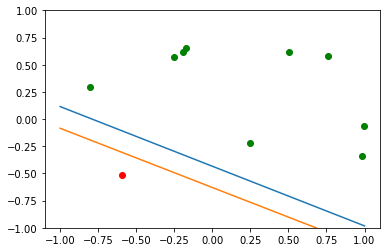

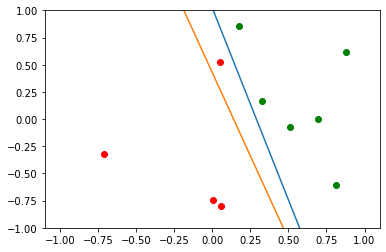

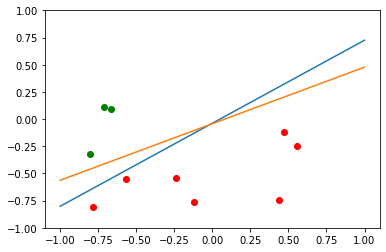

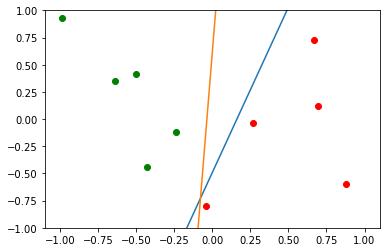

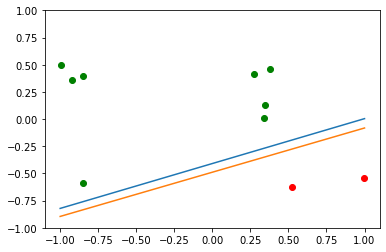

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


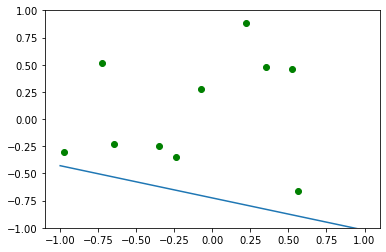

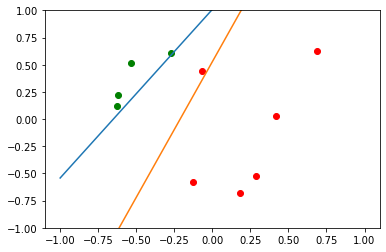

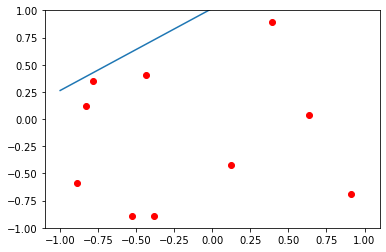

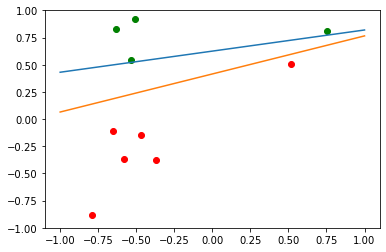

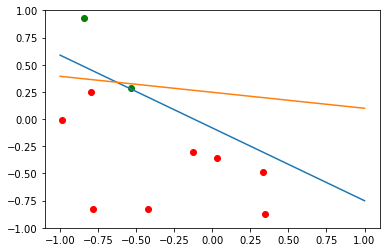

...

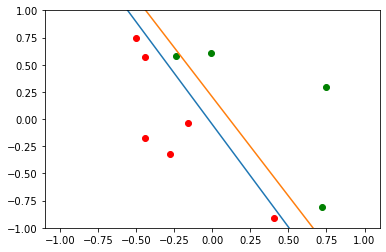

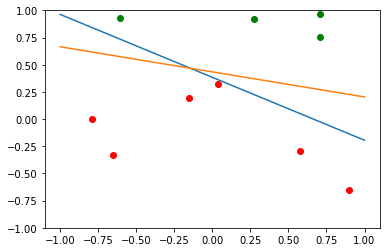

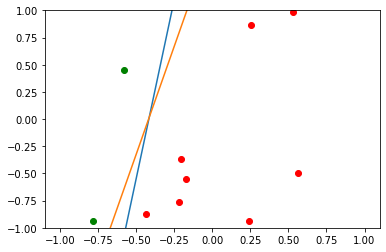

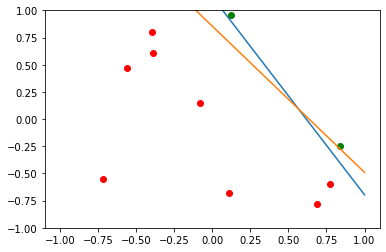

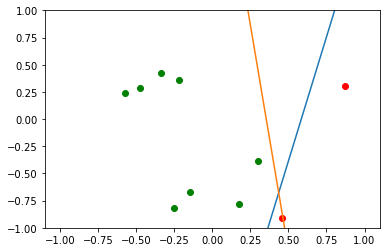

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


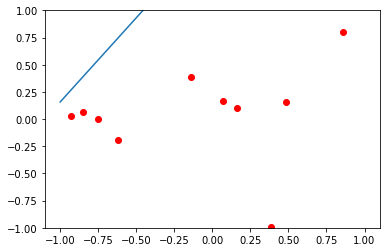

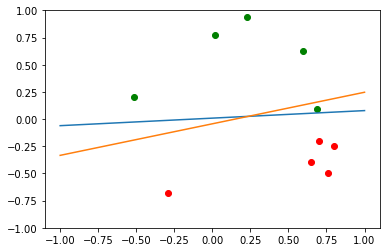

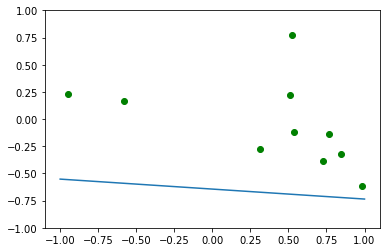

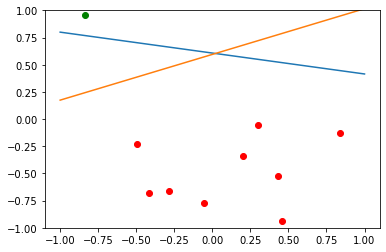

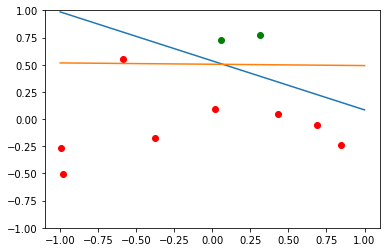

...

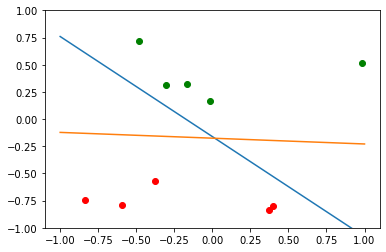

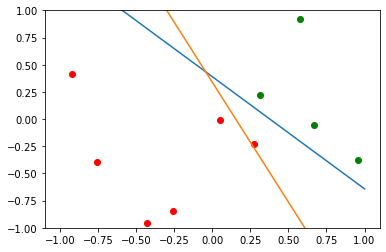

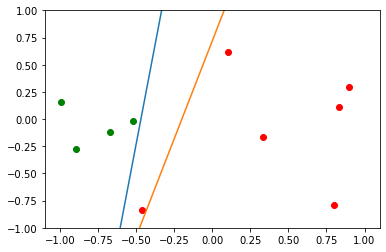

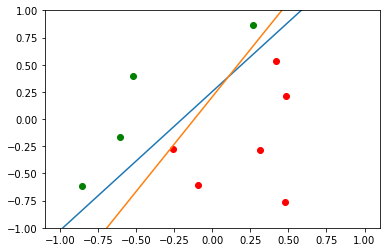

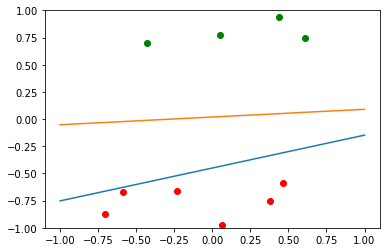

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


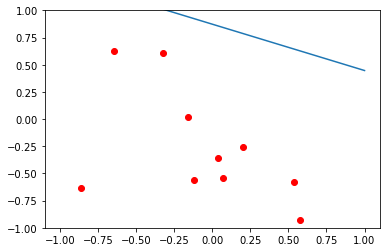

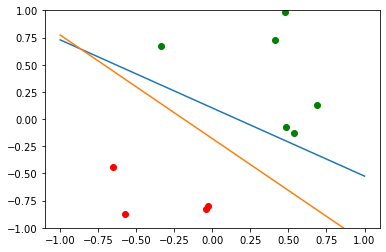

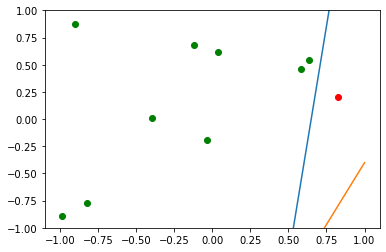

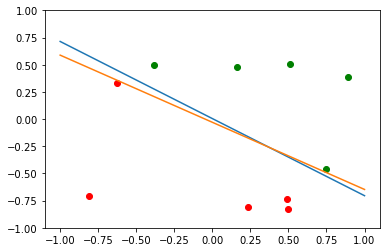

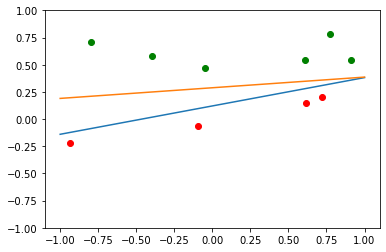

...

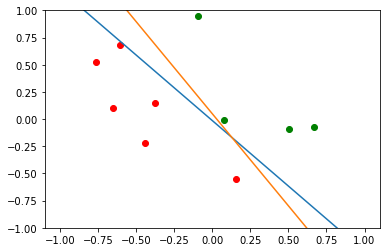

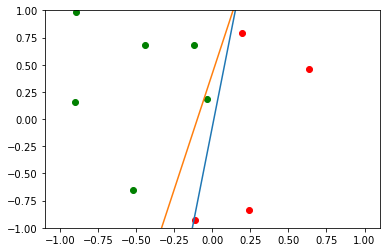

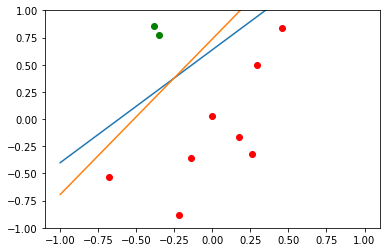

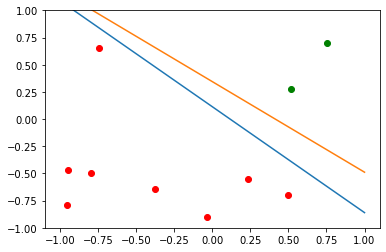

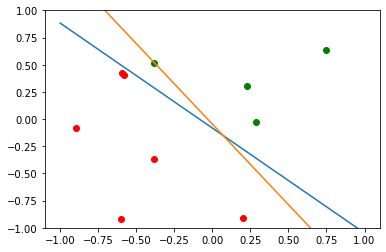

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


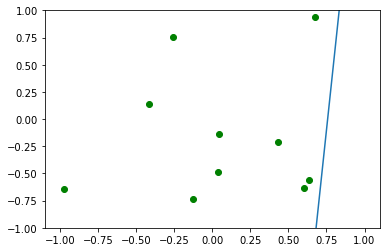

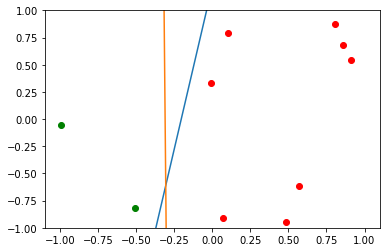

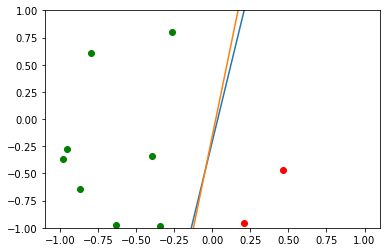

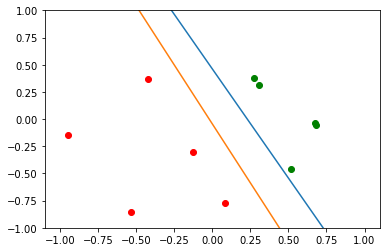

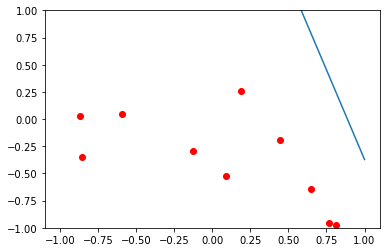

...

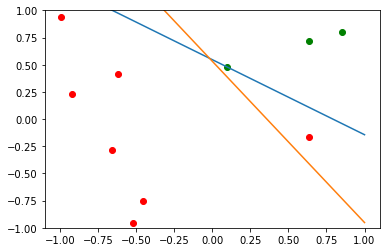

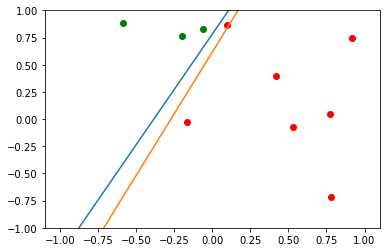

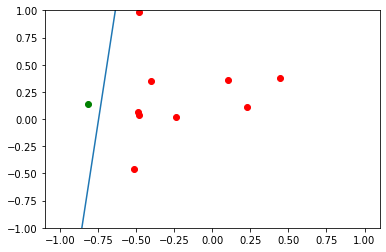

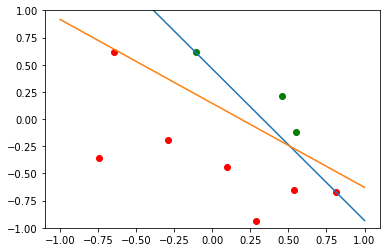

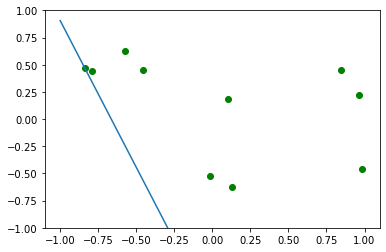

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


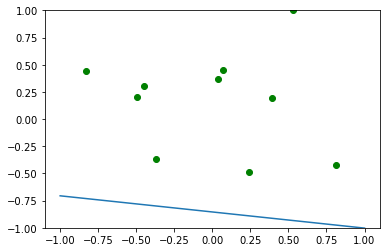

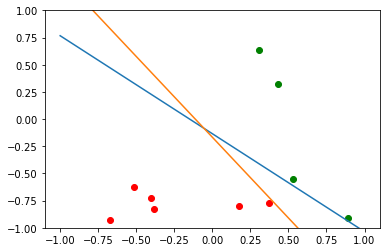

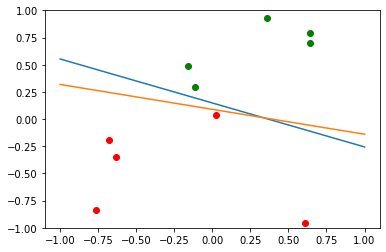

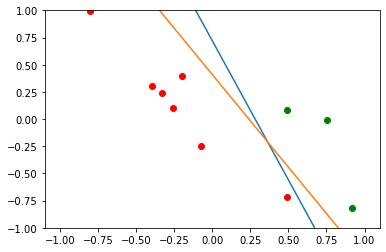

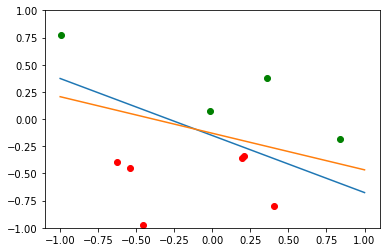

...

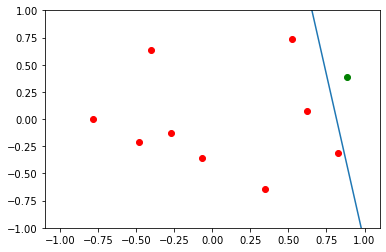

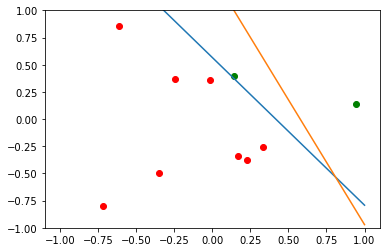

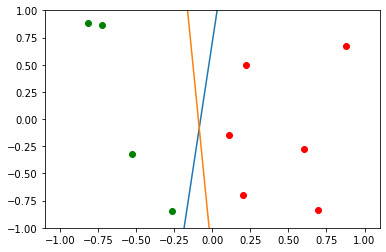

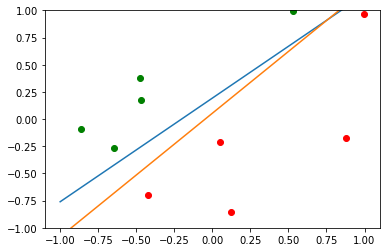

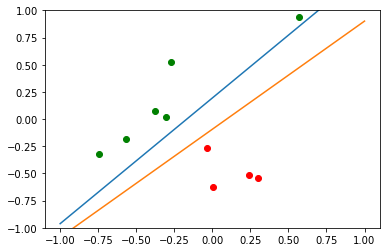

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


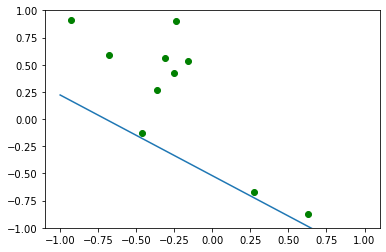

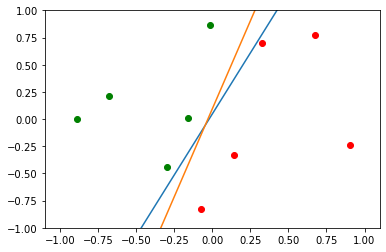

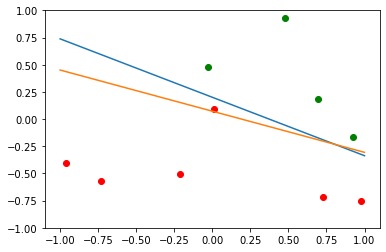

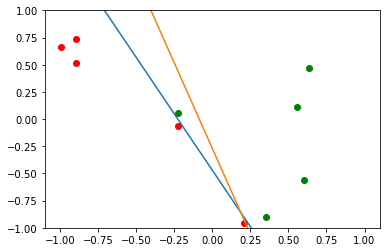

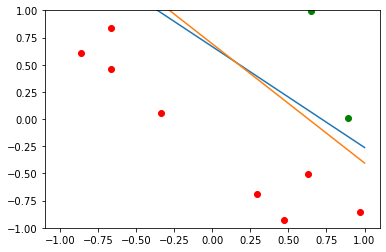

...

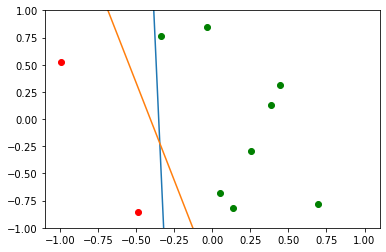

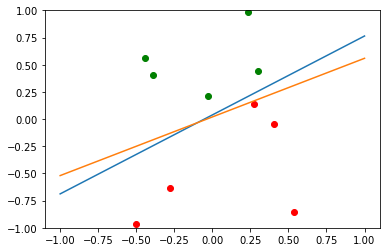

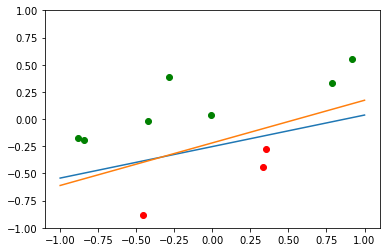

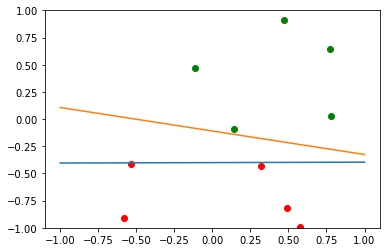

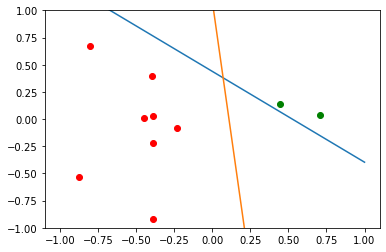

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


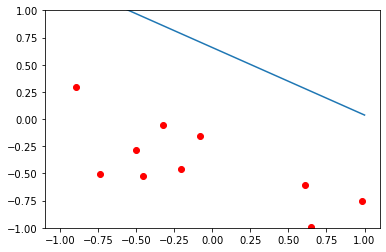

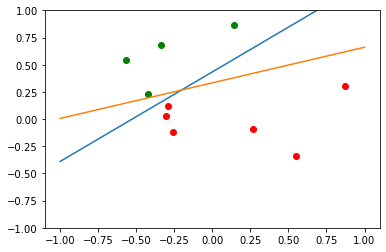

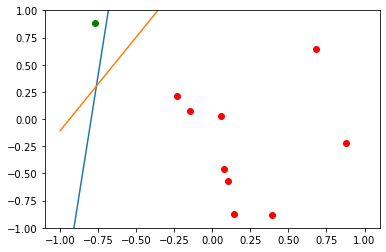

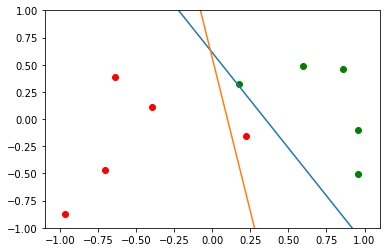

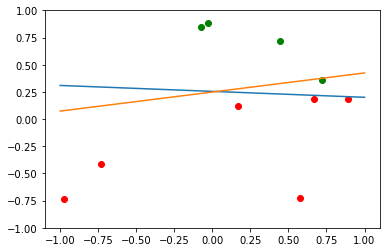

...

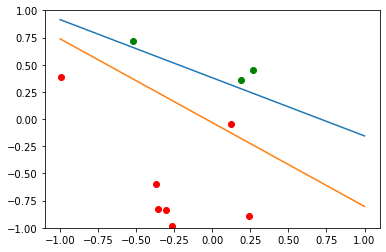

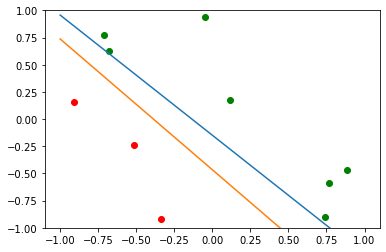

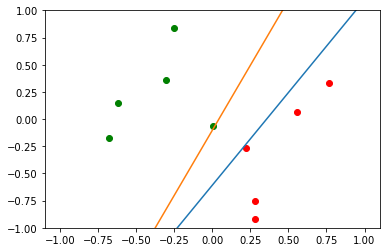

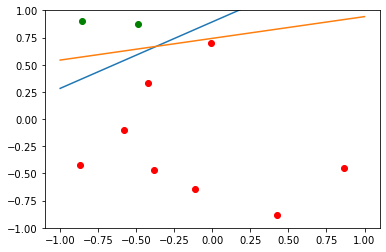

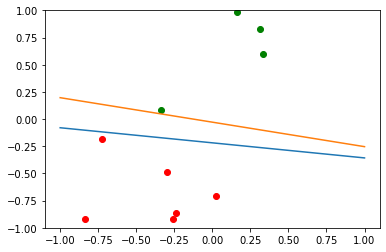

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


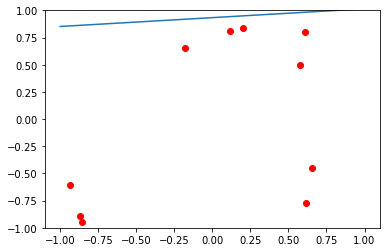

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


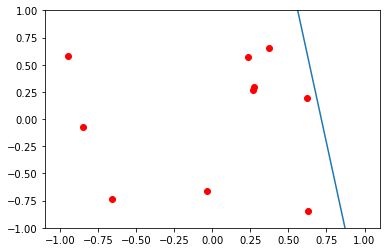

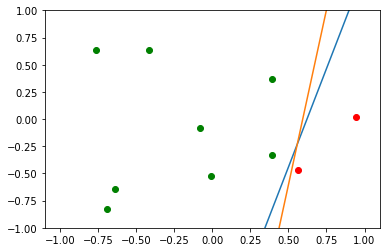

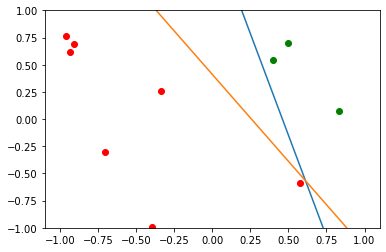

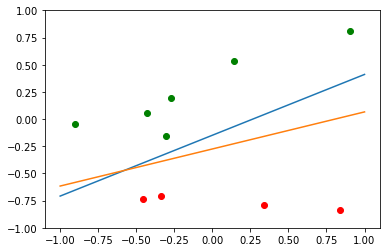

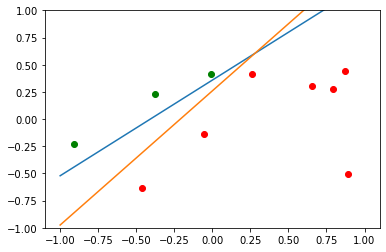

...

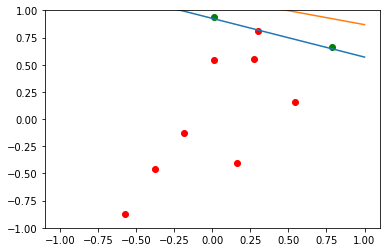

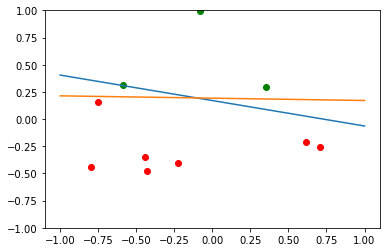

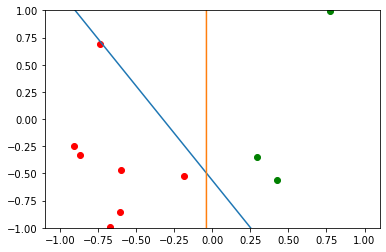

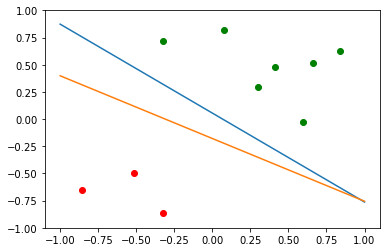

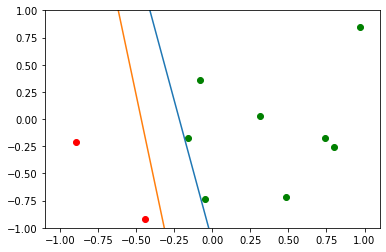

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


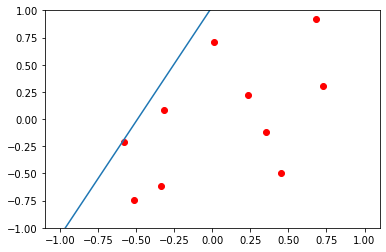

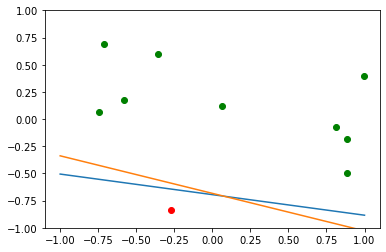

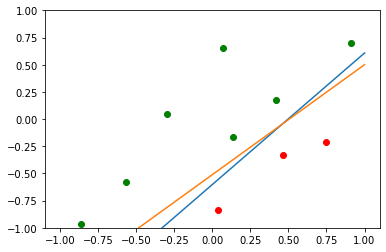

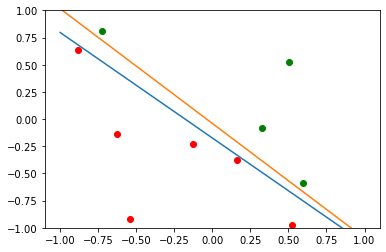

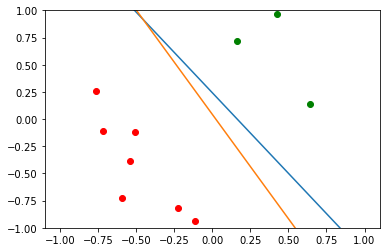

...

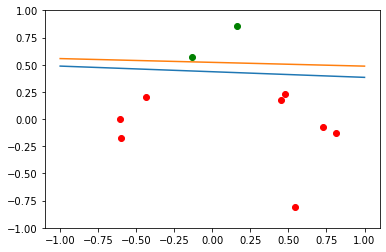

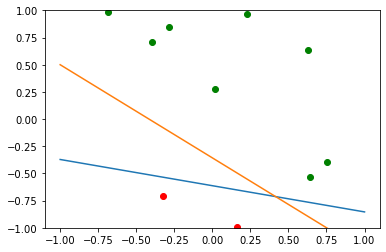

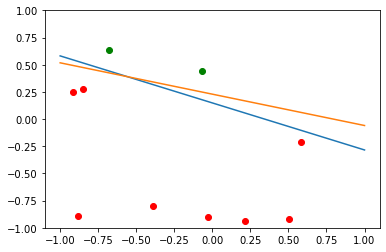

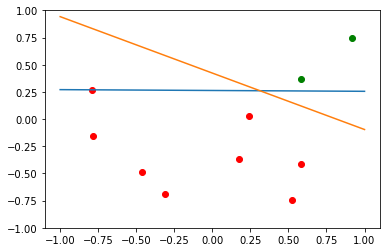

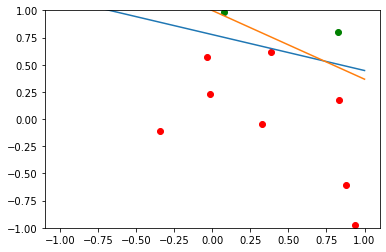

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


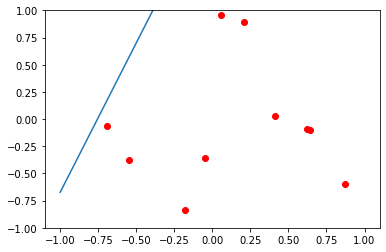

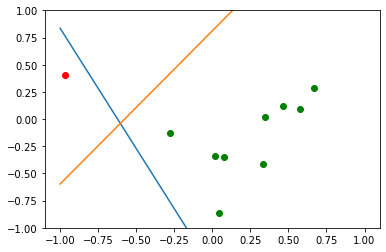

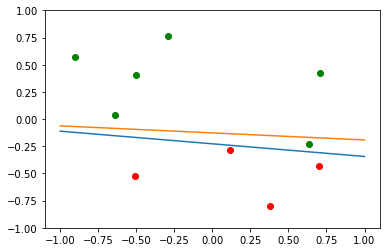

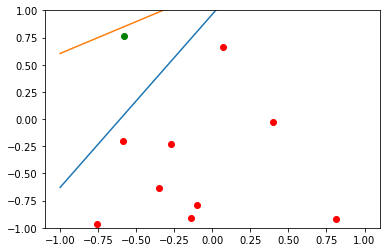

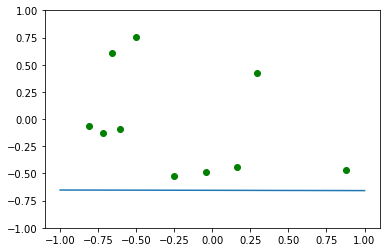

...

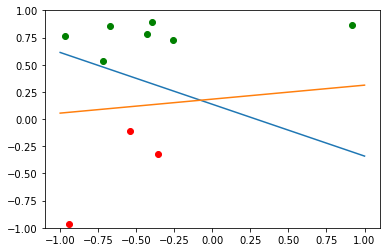

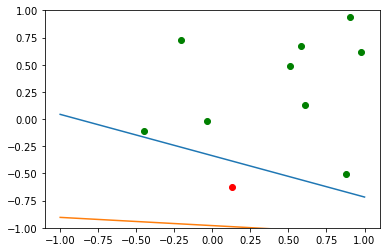

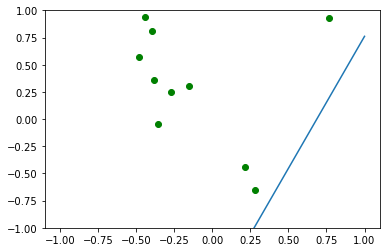

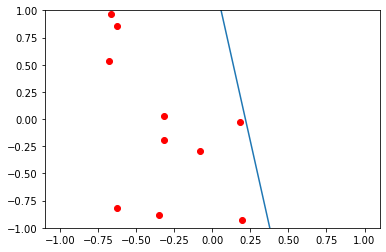

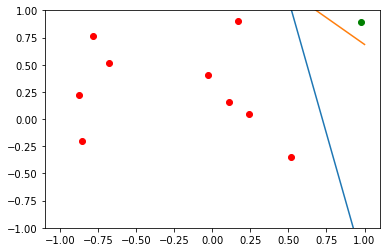

<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: divide by zero encountered in true_divide
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
<ipython-input-89-ff4cd3857c01>:42: RuntimeWarning: invalid value encountered in subtract
  x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]


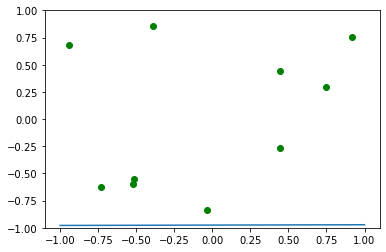

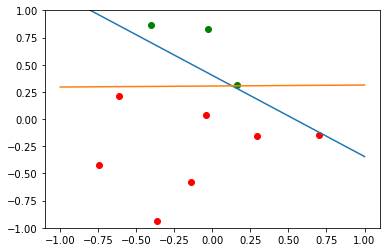

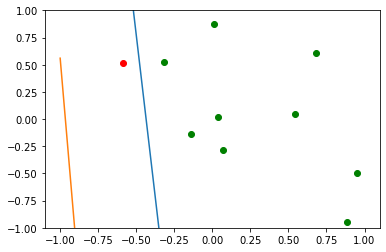

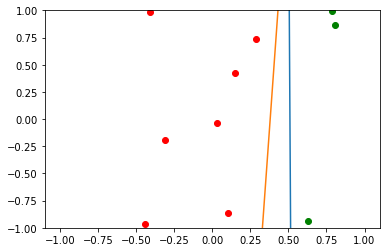

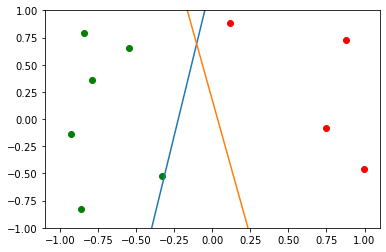

...

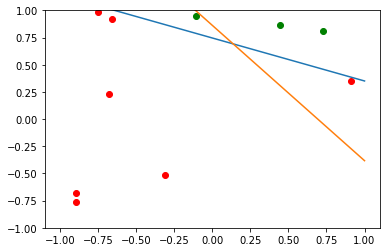

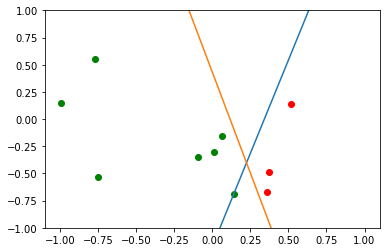

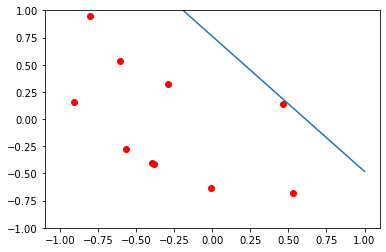

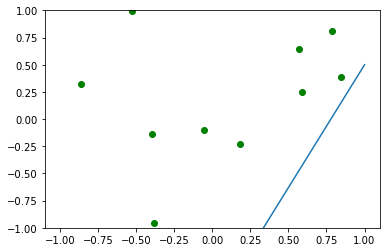

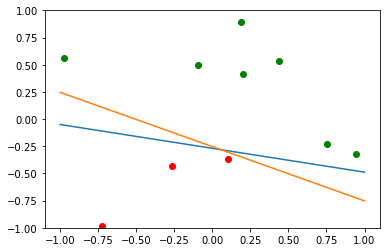

In [89]:
import matplotlib.pyplot as plt
import numpy as np
Error = []
G = []
G2 = []
F = []
Xdata = []
Run = []
for i in range(1000):
    def target(xfunc):
        a = (xfunc[1][1]-xfunc[0][1])/(xfunc[1][0]-xfunc[0][0])
        b = xfunc[0][1] - a*xfunc[0][0]
        return a,b

    def data(N,d):
        data = np.random.uniform(-1,1,(N,d))
        return data
    xfunc = np.random.uniform(-1,1,(2,2))
    a,b = target(xfunc)
    d = 2
    N = 10
    xdata = data(N,d)
    f = a*xdata[:,0] + b
    xaxis = np.linspace(-1,1,1000)
    yval = np.reshape(np.sign(xdata[:,1] - f),(-1,1))
    points = np.concatenate((xdata,yval),axis=1)
    for point in range(len(points[:,-1])):
        if points[point,-1] == 1:
            plt.scatter(points[point,0],points[point,1],color='green',label = 'green')
        else:
            plt.scatter(points[point,0],points[point,1],color='red', label = 'red')
    plt.ylim(-1,1)
    plt.plot(xaxis,a*xaxis + b, label = 'target function')
    x0 = np.ones((N,1))
    x = np.concatenate((x0,xdata),axis=1)

    #Linear regression algorithm
    X = np.dot(np.linalg.inv(np.dot(np.transpose(x),x)),np.transpose(x)) #X = (x^T*x)^-1*x^T

    w = np.dot(X,yval)

    x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
    plt.plot(xaxis,x2,label = 'hypothesis function')
    plt.show()
    norm = np.linalg.norm(np.sign(np.dot(x,w))-np.transpose(yval))
    Ein = (norm**2)/N
    Error.append(Ein)
    G.append(w)
    F.append([a,b])
    Xdata.append(x)
    run = 0
    while np.any(np.sign(w[0] + w[1]*x[:,1] + w[2]*x[:,2]) != np.transpose(yval)):
        for i in range(N):
            if np.sign(w[0] + w[1]*x[i][1] + w[2]*x[i][2]) != yval[i]:
                w = w + np.reshape(x[i]*yval[i],(3,1))
                run += 1
    G2.append(w)
    Run.append(run)        

In [90]:
print(sum(Run)/len(Run))

4.782


In [86]:
import matplotlib.pyplot as plt
import numpy as np
Error = []
G = []
F = []
for i in range(1000):

    def data(N,d):
        data = np.random.uniform(-1,1,(N,d))
        return data
    xfunc = np.random.uniform(-1,1,(2,2))
    a,b = target(xfunc)
    d = 2
    N = 100
    xdata = data(N,d)
    f = np.sign((xdata[:,0])**2 + (xdata[:,1])**2 - 0,6)
    xaxis = np.linspace(-1,1,1000)
    yval = np.reshape(f,(-1,1))
    points = np.concatenate((xdata,yval),axis=1)
    for point in range(len(points[:,-1])):
        if points[point,-1] == 1:
            plt.scatter(points[point,0],points[point,1],color='green',label = 'green')
        else:
            plt.scatter(points[point,0],points[point,1],color='red', label = 'red')
    plt.ylim(-1,1)
    #plt.plot(xaxis,a*xaxis + b, label = 'target function')
    x0 = np.ones((N,1))
    x = np.concatenate((x0,xdata),axis=1)

    #Linear regression algorithm
    X = np.dot(np.linalg.inv(np.dot(np.transpose(x),x)),np.transpose(x)) #X = (x^T*x)^-1*x^T

    w = np.dot(X,yval)

    x2 = -(w[1]/w[2])*xaxis-w[0]/w[2]
    plt.plot(xaxis,x2,label = 'hypothesis function')
    plt.show()
    norm = np.linalg.norm(np.sign(np.dot(x,w))-yval)
    Ein = (norm**2)/N
    Error.append(Ein)
    G.append(w)
    F.append([a,b])

[[-1.11885603 -0.30904123 -0.35552473]
 [ 0.23116263  1.04097743  0.99449393]
 [-0.5821026   0.2277122   0.1812287 ]]


<ipython-input-112-3f30dc1997ff>:17: RuntimeWarning: invalid value encountered in sqrt
  plt.plot(xaxis,(-xaxis**2 + 0.6)**(0.5), label = 'target function')


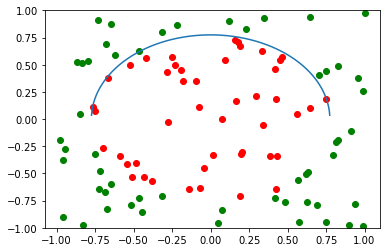

In [112]:
def data(N,d):
    data = np.random.uniform(-1,1,(N,d))
    return data
d = 2
N = 100
xdata = data(N,d)
f = np.sign((xdata[:,0])**2 + (xdata[:,1])**2 - 0.6)
xaxis = np.linspace(-1,1,1000)
yval = np.reshape(f,(-1,1))
points = np.concatenate((xdata,yval),axis=1)
for point in range(len(points[:,-1])):
    if points[point,-1] == 1:
        plt.scatter(points[point,0],points[point,1],color='green',label = 'green')
    else:
        plt.scatter(points[point,0],points[point,1],color='red', label = 'red')
plt.ylim(-1,1)
plt.plot(xaxis,(-xaxis**2 + 0.6)**(0.5), label = 'target function')

In [108]:
print((xdata[:,0])**2 + (xdata[:,1])**2 -0.6)

[-4.88881042e-01 -2.94231505e-01 -1.04324501e-01  1.40731713e-01
  3.33659187e-01  2.91603674e-01 -2.91884913e-01 -2.20919494e-01
  8.19584972e-03  6.99648755e-01  7.01134987e-01  1.19162253e+00
 -8.57304614e-02  5.41238084e-01  7.70292282e-02 -5.95039456e-01
  1.14845906e-01 -3.55505328e-01  4.60947301e-01  4.29137915e-01
 -1.40282245e-01 -5.88027588e-01  1.48228729e-01 -1.58242976e-01
 -1.61921187e-01  1.00887097e+00  1.61469354e-01  3.52858366e-02
 -3.84049736e-02 -4.90631093e-01  2.96740997e-01  3.05858566e-01
 -6.24122548e-02  5.36813494e-01  9.54247216e-02 -3.12957483e-01
  1.55658320e-01  2.77940501e-01 -5.80300174e-01  1.40799993e-01
  2.05040896e-01  2.16908106e-01  2.75055262e-01  7.75411134e-01
  1.87403661e-01 -5.14121550e-02  6.38026605e-01 -1.39517473e-01
  6.09920169e-01 -1.45850033e-01  1.54888155e-01  8.91128356e-02
  6.14807381e-01 -1.10990757e-03 -5.26680727e-01 -3.15739945e-01
  7.99132183e-01  6.82013459e-01  9.22194908e-01  1.57155851e-02
 -4.14770614e-01 -1.13854

In [102]:
print(xdata)

[[ 0.05888085  0.32810365]
 [-0.53563273 -0.13735385]
 [-0.34971081 -0.61104652]
 [-0.70153641 -0.49857636]
 [-0.7512261  -0.60771583]
 [-0.41739603 -0.84698538]
 [ 0.48415928 -0.27148642]
 [-0.61263485 -0.06131108]
 [ 0.76837989 -0.13337239]
 [ 0.6449162  -0.94007013]
 [ 0.96786362 -0.60363482]
 [-0.93743978 -0.95542095]
 [-0.70275901  0.14282616]
 [ 0.49307945 -0.94768705]
 [ 0.82167948 -0.04326724]
 [-0.03223131 -0.06262337]
 [-0.81230512 -0.2345342 ]
 [ 0.28252385  0.40580161]
 [ 0.59761949  0.83892684]
 [ 0.84442136  0.56221925]
 [ 0.65444101  0.17727017]
 [-0.02214719 -0.1071537 ]
 [-0.85274959 -0.14507538]
 [ 0.16569424 -0.6436633 ]
 [ 0.15094588 -0.6444332 ]
 [-0.83425411  0.95545332]
 [ 0.87143814 -0.04544136]
 [-0.43624155  0.66706757]
 [-0.22567944  0.71460746]
 [ 0.12005107  0.30815037]
 [-0.8052225  -0.49835502]
 [-0.69330136 -0.65206732]
 [ 0.54402074  0.49155792]
 [ 0.42773293 -0.97665656]
 [ 0.79001823 -0.26701296]
 [-0.53268738 -0.05732947]
 [ 0.42414303  0.75878917]
 